In [1]:
import os
import cv2
import time
import random
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from pynq.lib.video import *
from pynq_dpu import DpuOverlay

In [2]:
overlay = DpuOverlay("dpu.bit")

In [3]:
overlay.load_model("group13_kv260.xmodel")

In [4]:
dpu = overlay.runner

inputTensors = dpu.get_input_tensors()
outputTensors = dpu.get_output_tensors()

shapeIn = tuple(inputTensors[0].dims)
shapeOut = tuple(outputTensors[0].dims)

In [5]:
input_data = [np.empty(shapeIn, dtype=np.float32, order="C")]
output_data = [np.empty(shapeOut, dtype=np.float32, order="C")]

In [6]:
# monitor configuration: 640*480 @ 60Hz
Mode = VideoMode(640,480,24)
displayport = DisplayPort()

displayport.configure(Mode, PIXEL_RGB)

In [7]:
# monitor (output) frame buffer size
frame_out_w = 1920
frame_out_h = 1080
# camera (input) configuration
frame_in_w = 640
frame_in_h = 480

In [8]:
# initialize camera from OpenCV
videoIn = cv2.VideoCapture(0 + cv2.CAP_V4L2)
videoIn.set(cv2.CAP_PROP_FRAME_WIDTH, frame_in_w);
videoIn.set(cv2.CAP_PROP_FRAME_HEIGHT, frame_in_h);

print("Capture device is open: " + str(videoIn.isOpened()))

Capture device is open: True


In [9]:
def resize_shortest_edge(image, size):
    H, W = image.shape[:2]
    if H >= W:
        nW = size
        nH = int(float(H)/W * size)
    else:
        nH = size
        nW = int(float(W)/H * size)
    return cv2.resize(image,(nW,nH))

def BGR2RGB(image):
    B, G, R = cv2.split(image)
    image = cv2.merge([R, G, B])
    return image

def normalize(image):
    return np.asarray(image/255.0, dtype=np.float32)

def preprocess_fn(image, crop_height = 224, crop_width = 224):
#     image = resize_shortest_edge(image, 256)
    image = BGR2RGB(image)
    image = normalize(image)
    return image

def calculate_softmax(data):
    result = np.exp(data)
    return result

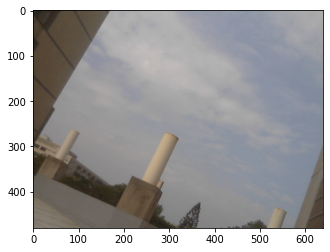

cloudy


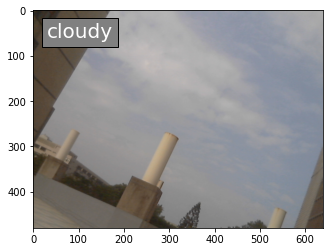

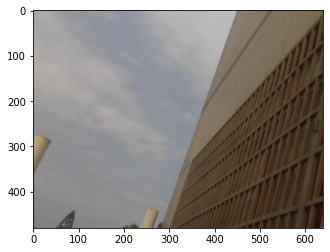

cloudy


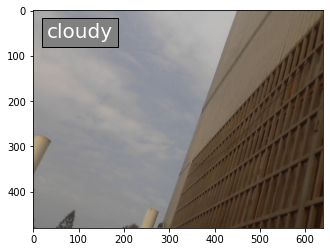

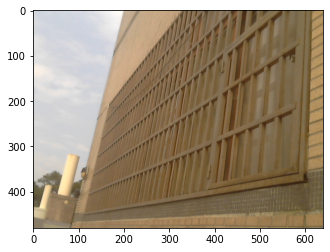

rainy


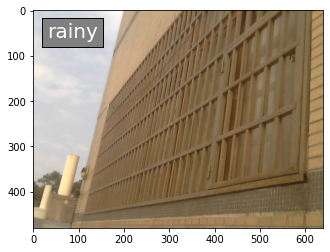

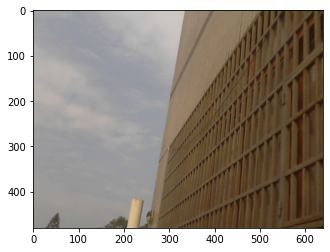

cloudy


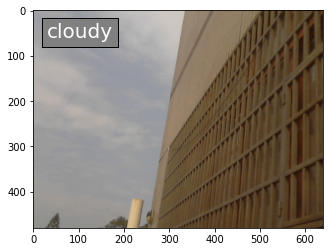

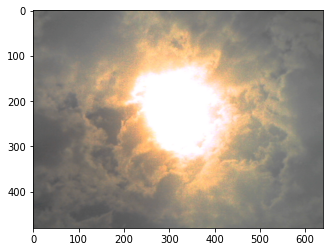

rainy


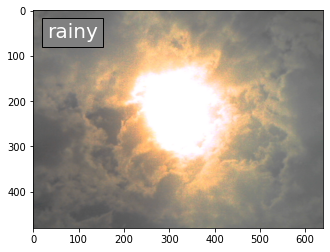

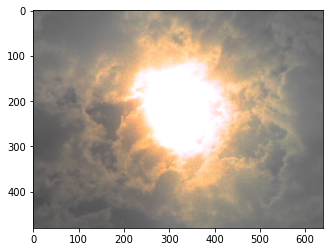

cloudy


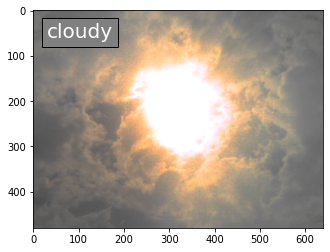

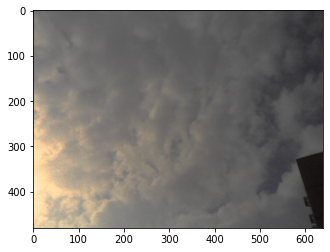

cloudy


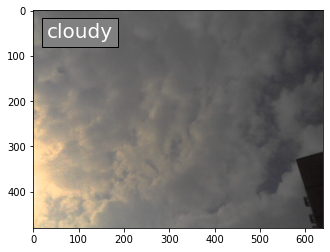

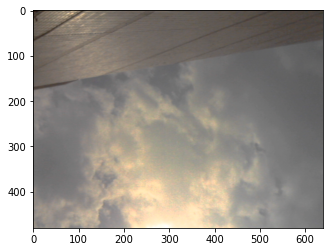

cloudy


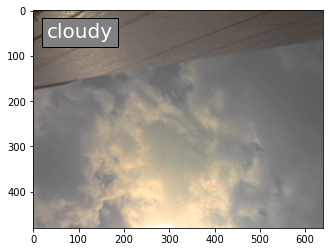

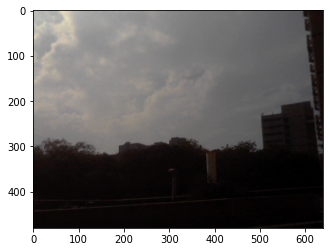

cloudy


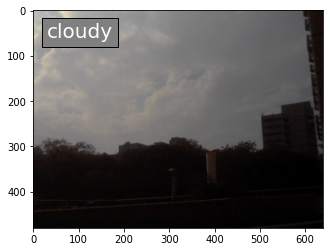

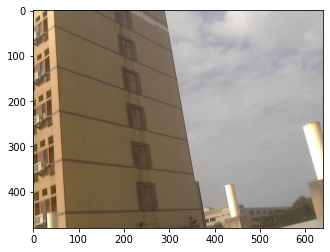

cloudy


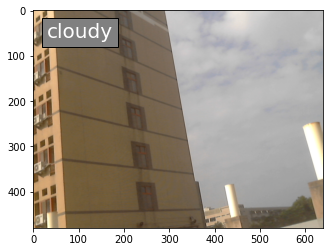

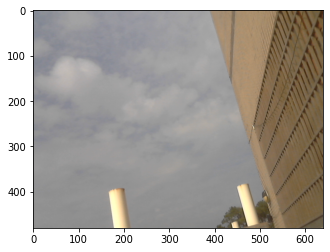

cloudy


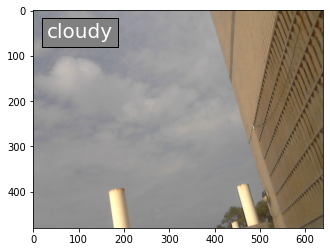

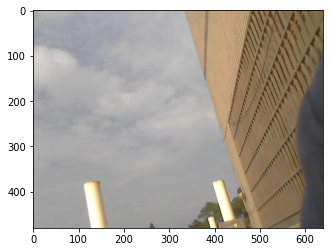

cloudy


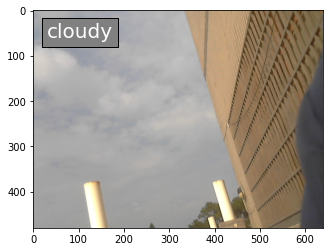

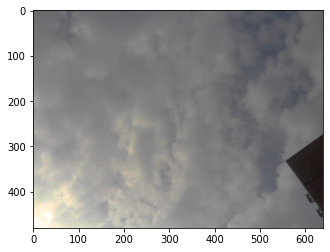

cloudy


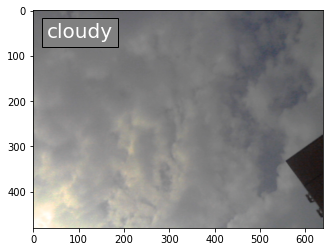

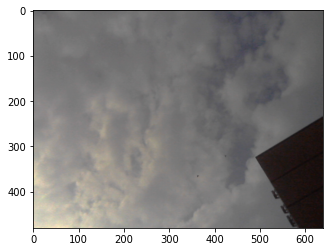

cloudy


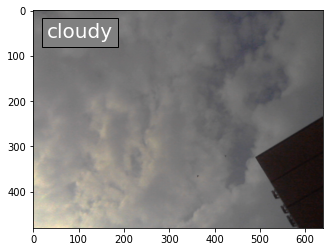

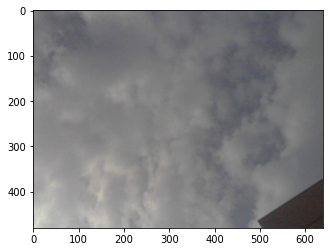

cloudy


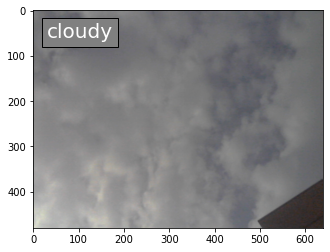

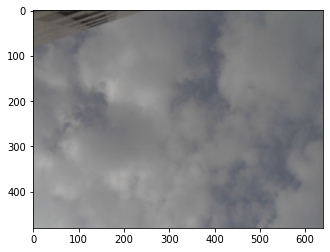

cloudy


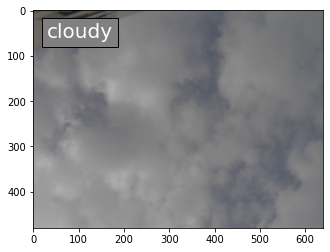

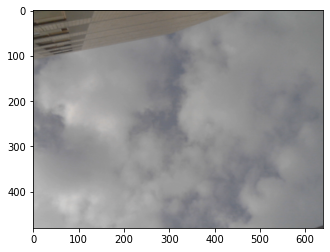

cloudy


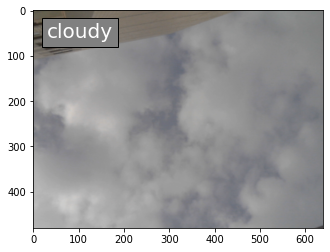

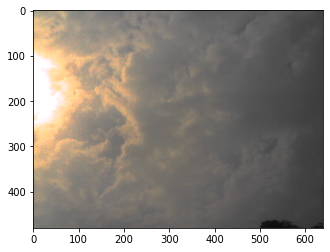

cloudy


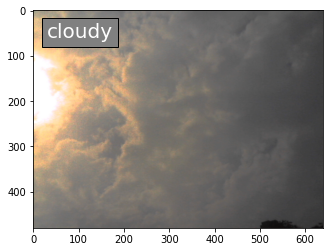

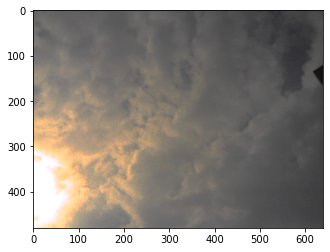

cloudy


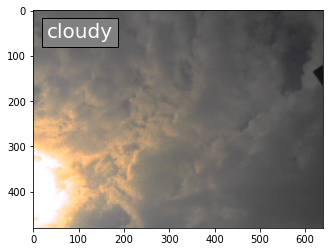

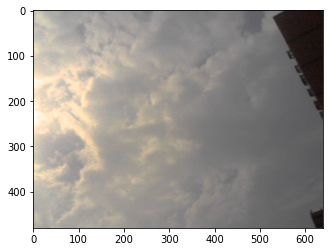

cloudy


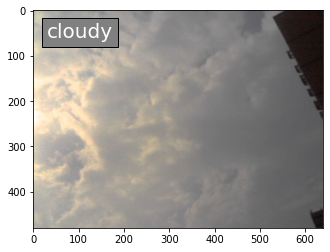

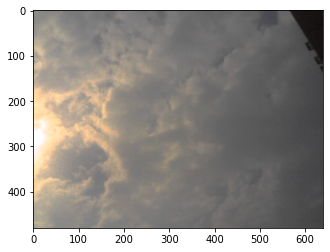

cloudy


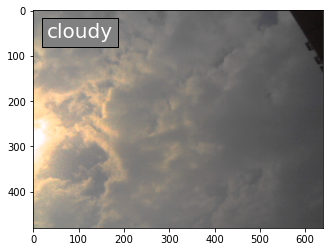

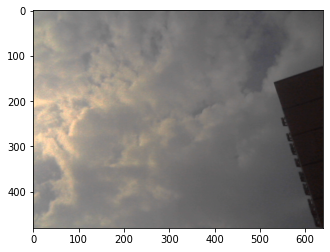

cloudy


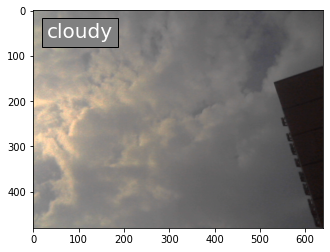

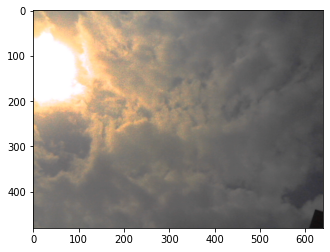

cloudy


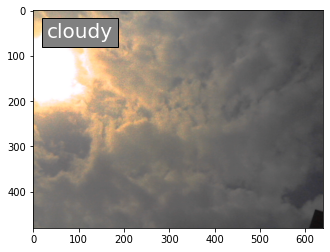

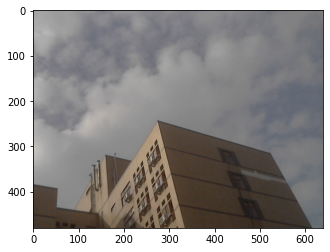

cloudy


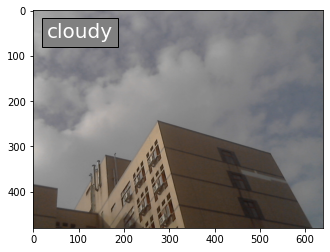

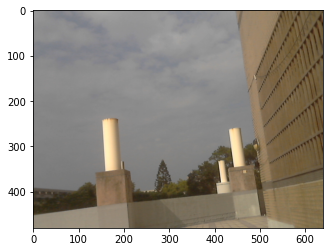

cloudy


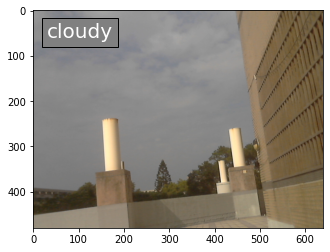

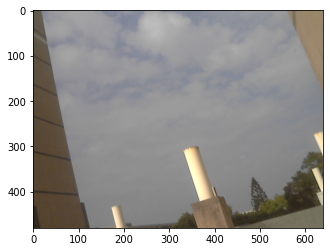

cloudy


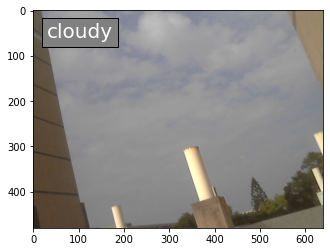

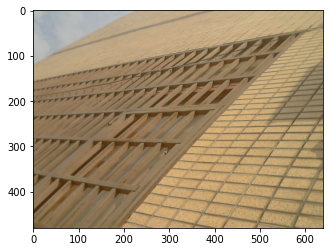

rainy


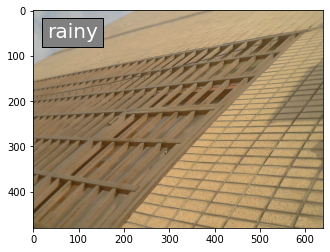

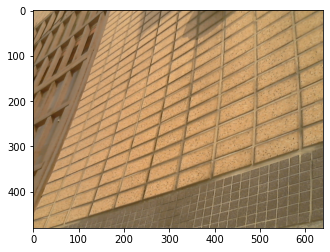

rainy


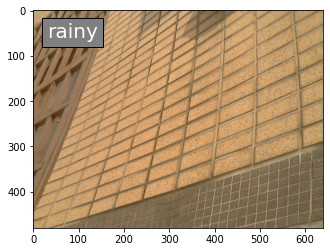

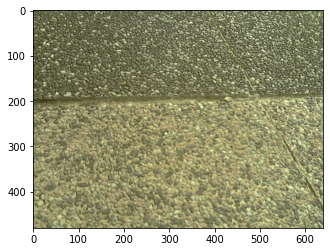

rainy


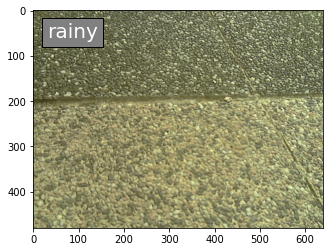

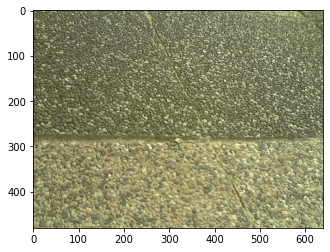

sunny


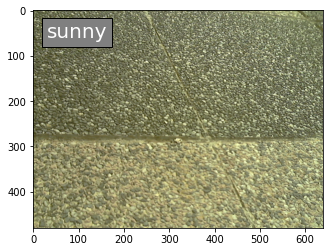

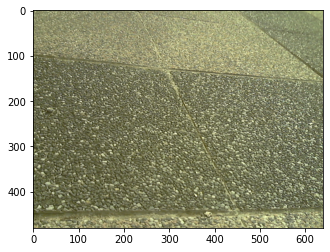

sunny


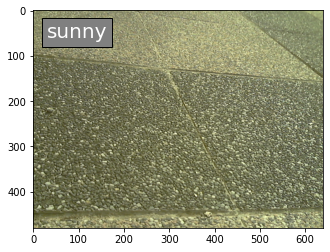

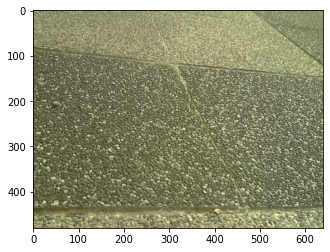

sunny


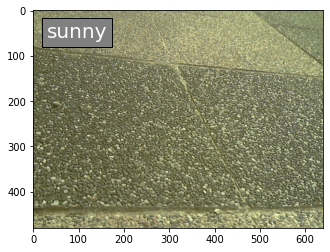

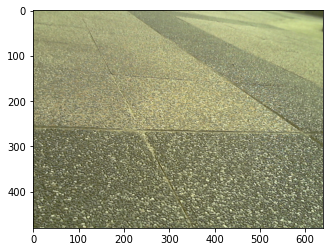

cloudy


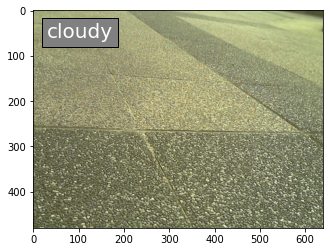

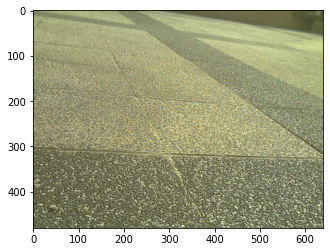

cloudy


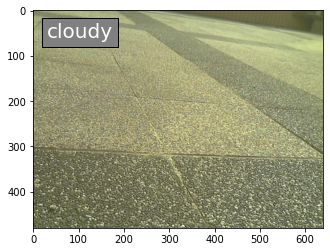

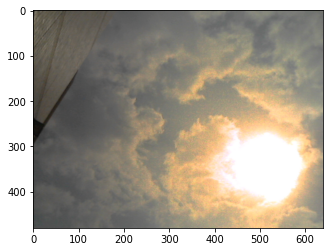

cloudy


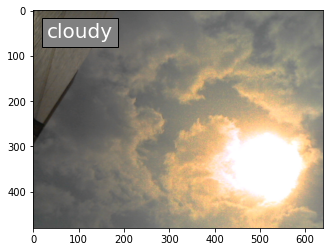

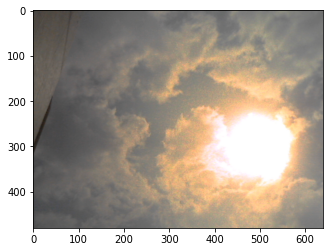

cloudy


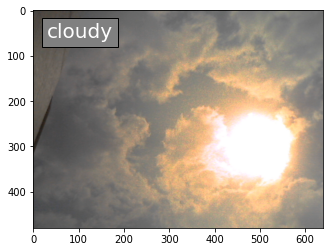

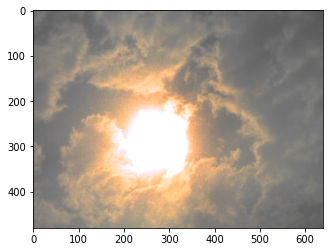

cloudy


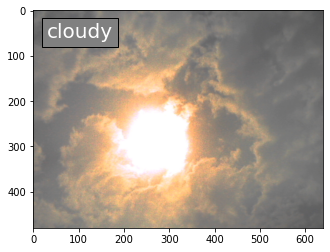

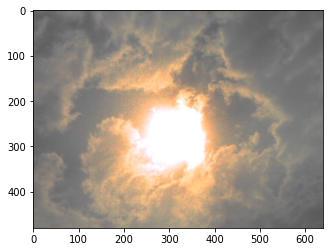

cloudy


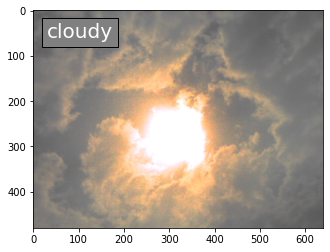

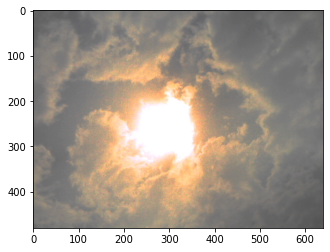

cloudy


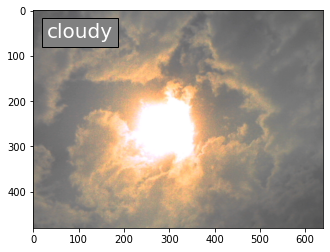

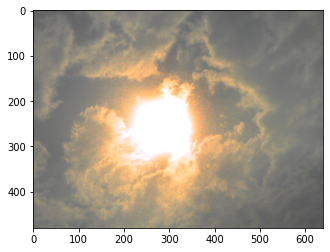

cloudy


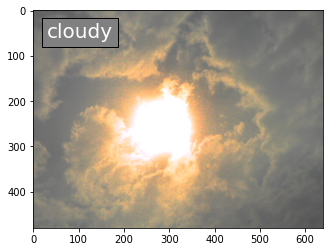

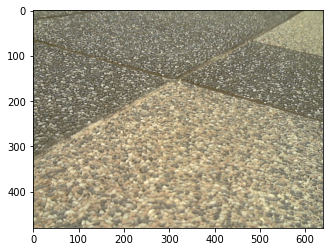

cloudy


In [ ]:
while True:
    # Capture webcam image
    ret, frame_vga = videoIn.read()

    # Display webcam image via Display Port Out
    if (ret):      
        #diplay on monitor
#         outframe = displayport.newframe()
#         outframe[:] = frame_vga
#         displayport.writeframe(outframe)
        
        # Display the frame
        plt.imshow(frame_vga[:,:,[2,1,0]])
        plt.show()
    else:
        raise RuntimeError("Failed to read from camera.")
        
    # Check if the user pressed 'q' to quit
    key = cv2.waitKey(1)
    if key == ord("q"):
        break
    
    # Sleep for 1 second
    time.sleep(1)
    
    # resize img
    img = frame_vga[:,:,[2,1,0]]
    img = cv2.resize(img, (224, 224), interpolation=cv2.INTER_LINEAR)
    # make prediction
    test_data = img
    input_data[0] = preprocess_fn(test_data)
    job_id = dpu.execute_async(input_data, output_data)
    dpu.wait(job_id)
    probs = calculate_softmax(output_data[0])
    predict = np.argmax(probs)
    classes = ['cloudy','rainy', 'sunny']
    print(classes[predict])
    
    # display result
    plt.imshow(frame_vga[:,:,[2,1,0]])
    plt.text(30, 60, classes[predict], fontsize=20, color='white', bbox={'facecolor':'grey', 'pad':5})
    plt.show()

    

In [ ]:
# Capture webcam image
ret, frame_vga = videoIn.read()

# Display webcam image via Display Port Out
if (ret):      
    #diplay on monitor
    outframe = displayport.newframe()
    outframe[:] = frame_vga
    displayport.writeframe(outframe)

    # Display the frame
    plt.imshow(frame_vga[:,:,[2,1,0]])
    plt.show()
else:
    raise RuntimeError("Failed to read from camera.")

In [ ]:
# Output webcam image as JPEG
plt.imshow(frame_vga[:,:,[2,1,0]])
plt.show()

In [ ]:
img = frame_vga[:,:,[2,1,0]]
img = cv2.resize(img, (224, 224), interpolation=cv2.INTER_LINEAR)

plt.imshow(img)

In [ ]:
test_data = img
input_data[0] = preprocess_fn(test_data)
job_id = dpu.execute_async(input_data, output_data)
dpu.wait(job_id)

probs = calculate_softmax(output_data[0])
predict = np.argmax(probs)
classes = ['cloudy','rainy', 'sunny']
print(classes[predict])

In [ ]:
plt.imshow(frame_vga[:,:,[2,1,0]])
plt.text(30, 60, classes[predict], fontsize=20, color='white', bbox={'facecolor':'grey', 'pad':5})
plt.show()

In [ ]:
# del overlay
# del dpu